In [1]:
import sys
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
sys.path.insert(-1, '../..')
import _utils
from cuml.svm import SVC

/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/dask/array/chunk_types.py:110: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy-cuda11x, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the Installation Guide for detailed instructions.

         https://docs.cupy.dev/en/stable/install.html

--------------------------------------------------------------------------------

  import cupy


In [2]:
adata = anndata.read('../lung_annotation/annotation/query_and_reference_final.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities

In [4]:
adata.obs['popv_prediction_score'].value_counts()

popv_prediction_score
8    39814
7    35496
6    15293
5     8176
4     4892
3     1540
2      108
1        3
Name: count, dtype: int64

In [5]:
adata

AnnData object with n_obs × n_vars = 105322 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', 'paper_annotation', 'sample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities

In [6]:
low_agreement_scores = ['1', '2', '3', '4', '5']
high_agreement_scores = ['6', '7', '8']

replace_dict = dict.fromkeys(low_agreement_scores, 'Low Consensus')
replace_dict.update(dict.fromkeys(high_agreement_scores, 'High Consensus'))

adata.obs['popv_score_agreement'] = adata.obs['popv_prediction_score'].astype(str).replace(replace_dict)
adata.obs['popv_score_agreement'] = adata.obs['popv_score_agreement'].astype('category').cat.reorder_categories(['Low Consensus','High Consensus'])

In [7]:
adata.obs['popv_score_agreement'].value_counts()

popv_score_agreement
High Consensus    90603
Low Consensus     14719
Name: count, dtype: int64

In [8]:
adata.obsm['X_umap'] = adata.obsm['X_scanvi_umap_popv']

/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


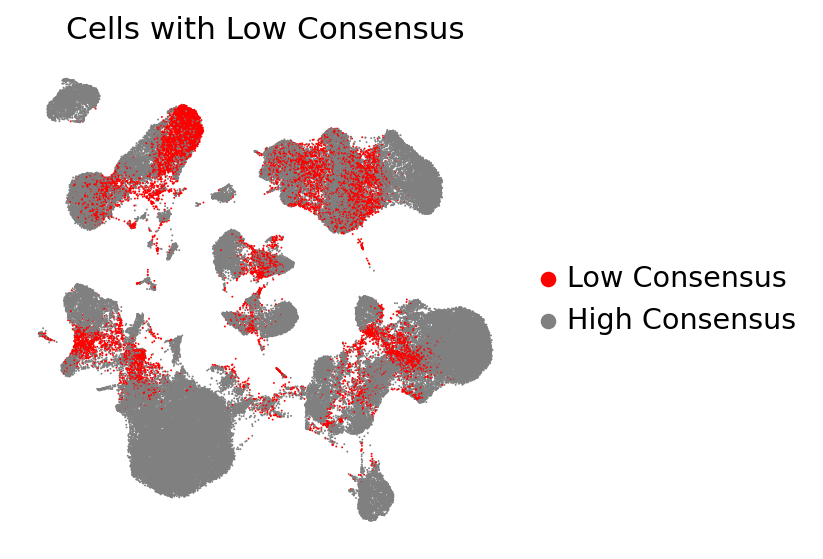

In [9]:
ax = sc.pl.umap(adata, 
                color = 'popv_score_agreement',
                palette = {
                      'Low Consensus':'red',
                      'High Consensus':'gray',
                     },
                title='Cells with Low Consensus',
                return_fig=True,
                size=3
          )

ax.get_figure().savefig('fig2/high_uncertainty.pdf', bbox_inches='tight', dpi=600)



# Tcells

In [10]:
tcells_cells = ['CD4-positive, alpha-beta T cell', 'CD8-positive, alpha-beta T cell', 'effector CD4-positive, alpha-beta T cell', 'effector CD8-positive, alpha-beta T cell', 'mature NK T cell']
tcells = adata[adata.obs['cell_ontology_class'].isin(tcells_cells)].copy()

/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

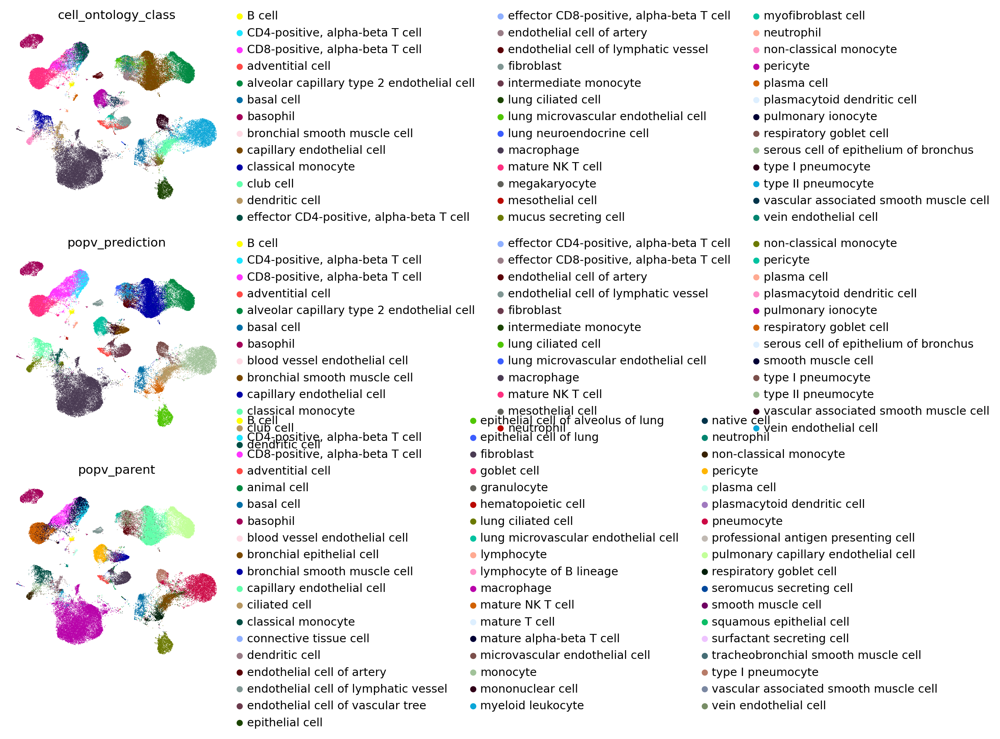

In [11]:
fig = sc.pl.umap(
    adata[adata.obs['_dataset']=='query'],
    color= ['cell_ontology_class', 'popv_prediction', 'popv_parent'],
    ncols=1)

In [12]:
from sklearn.multiclass import OneVsRestClassifier
X = adata[adata.obs['_dataset']=='ref'].X.A
y = adata.obs.loc[adata.obs['_dataset']=='ref', '_labels_annotation'].cat.codes

# lists to store the models and predictions
models = []
prediction_keys = []
cs = 4 * [1.] + 4 * [0.1]
kernels = 2 * ['linear', 'poly', 'rbf', 'sigmoid']
gammas = 8 * ['auto']

# train 5 SVMs and make predictions
for i in range(8):
    print(i)
    # create and train the SVM
    clf = OneVsRestClassifier(SVC(C=cs[i], kernel=kernels[i]))
    clf.fit(X, y)
    print('finished training')

    # predict the results
    adata.obs[f'svm_k_{kernels[i]}_g_{gammas[i]}_c_{cs[i]}'] = adata.obs.loc[adata.obs['_dataset']=='ref', '_labels_annotation'].cat.categories[clf.predict(adata.X.A)]
    prediction_keys.append(f'svm_k_{kernels[i]}_g_{gammas[i]}_c_{cs[i]}')

0
[W] [16:00:50.848368] SVC with the linear kernel can be much faster using the specialized solver provided by LinearSVC. Consider switching to LinearSVC if tranining takes too long.
finished training


1
finished training
2
finished training
3
finished training
4
finished training
5
finished training
6
finished training
7
finished training


/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute

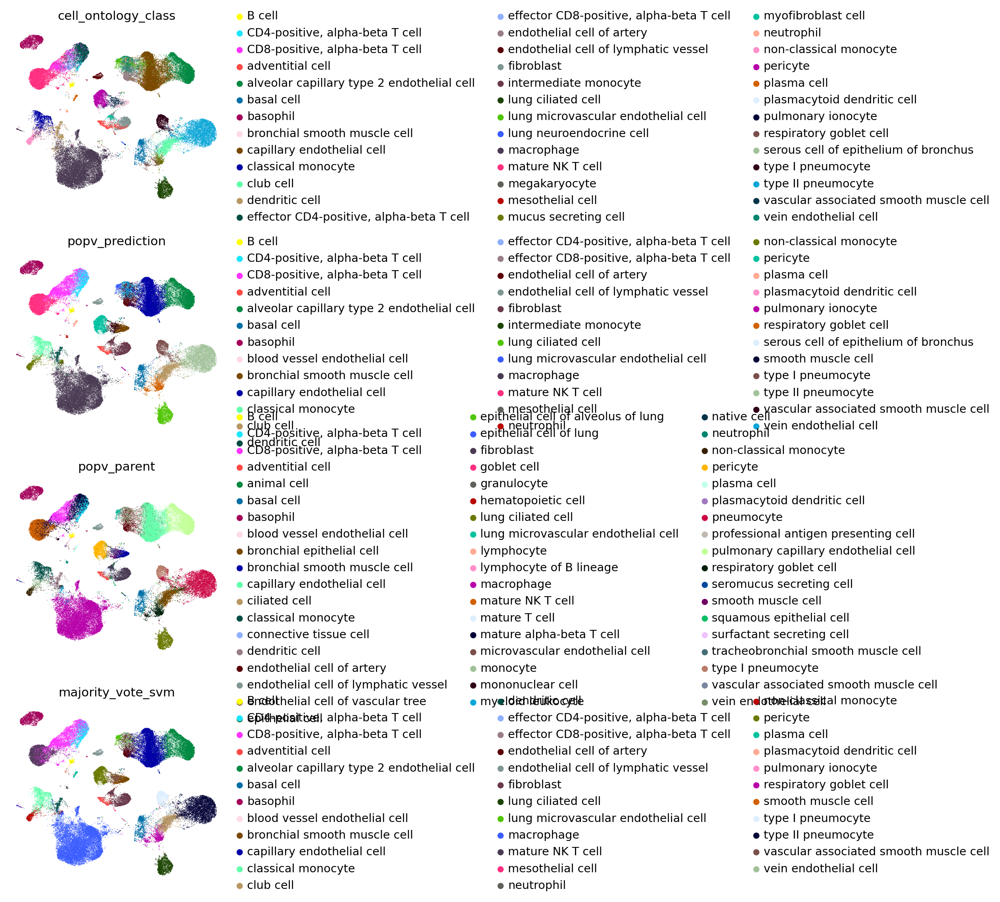

In [13]:
adata.obs['majority_vote_svm'] = adata.obs[prediction_keys].apply(lambda x: x.mode()[0], axis=1)
adata.obs['majority_vote_svm_score'] = adata.obs[prediction_keys].apply(lambda x: x.value_counts().max(), axis=1).astype('category')

fig = sc.pl.umap(
    adata[adata.obs['_dataset']=='query'],
    color= ['cell_ontology_class', 'popv_prediction', 'popv_parent', 'majority_vote_svm'],
    ncols=1)

In [14]:
low_agreement_scores = ['1', '2', '3', '4', '5']
high_agreement_scores = ['6', '7', '8']

replace_dict = dict.fromkeys(low_agreement_scores, 'Low Consensus')
replace_dict.update(dict.fromkeys(high_agreement_scores, 'High Consensus'))

adata.obs['svm_score_agreement'] = adata.obs['majority_vote_svm_score'].astype(str).replace(replace_dict)
adata.obs['svm_score_agreement'] = adata.obs['svm_score_agreement'].astype('category').cat.reorder_categories(['Low Consensus','High Consensus'])

/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


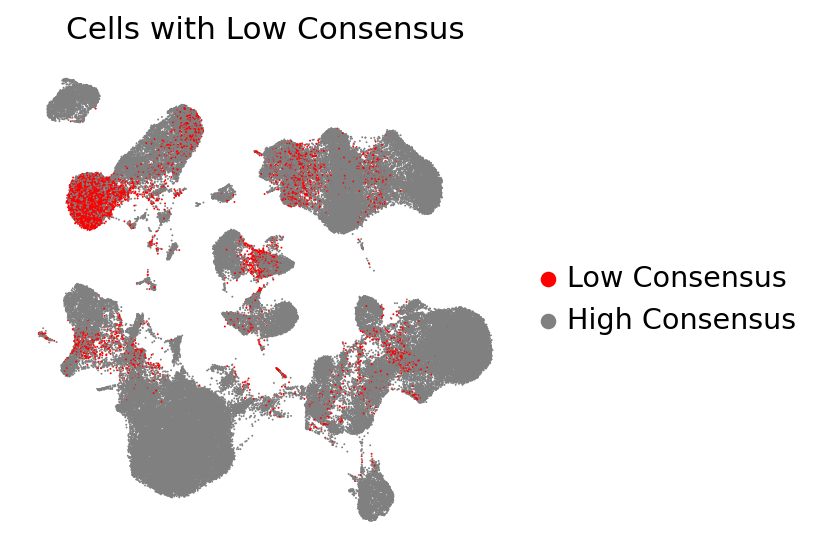

In [15]:
ax = sc.pl.umap(adata, 
                color = 'svm_score_agreement',
                palette = {
                      'Low Consensus':'red',
                      'High Consensus':'gray',
                     },
                title='Cells with Low Consensus',
                return_fig=True,
                size=3
          )

ax.get_figure().savefig('fig2/high_uncertainty_svm.pdf', bbox_inches='tight', dpi=600)



In [16]:
from popv.reproducibility import _accuracy
import popv

2024-04-19 16:08:08.875683: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-19 16:08:08.992822: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-19 16:08:09.745612: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
From /home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/tensorflow/python/compat/v2_compat.py:107: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for upda

In [17]:
obo_fn = '../../PopV/ontology/cl.obo'

G = popv._utils.make_ontology_dag(obo_fn)

In [18]:
_accuracy._ontology_accuracy(
    adata, 
    obofile=obo_fn,
    gt_key='cell_ontology_class', 
    pred_key='popv_prediction',
    save_key=f'consensus_ontology_accuracy')

In [19]:
_accuracy._ontology_accuracy(
    adata, 
    obofile=obo_fn,
    gt_key='cell_ontology_class', 
    pred_key='majority_vote_svm',
    save_key=f'consensus_svm_ontology_accuracy')

In [20]:
color_map = ['#1f77b4',
             '#2ca02c',
             '#9467bd',
             '#ff7f0e',
             '#d62728',
             '#8c564b',
             '#e377c2',
             '#7f7f7f',
             '#bcbd22',
             '#17becf']

In [21]:
parent = 'parent'
child = 'child'
exact = 'exact'
sibling = 'sibling'

In [23]:
query = adata[adata.obs['_dataset']=='query']
query.obs['popv_prediction_probabilities'] = query.obs['popv_prediction_score'].astype(float)/8.
query.obs['majority_vote_svm_probabilities'] = query.obs['majority_vote_svm_score'].astype(float)/8.

In [24]:
acc_annotated_cols_dict = {
 'consensus_svm_ontology_accuracy': 'majority_vote_svm',
 'consensus_ontology_accuracy': 'popv_prediction'}

In [25]:
parent = 'parent'
child = 'child'
exact = 'exact'
sibling = 'sibling'

In [26]:
rename_dict = {
    'popv_prediction': 'popV',
    'majority_vote_svm': 'Majority Voting SVM',
}

In [27]:
sklearn.metrics.f1_accuracy?

Object `sklearn.metrics.f1_accuracy` not found.


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 47 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'M', 'N', 'P', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'equal', 'f', 'five', 'four', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 32, 36, 38, 40, 48, 49, 51, 54, 57, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 83, 85, 87, 88, 91, 92]
Closed glyph list over 'GSUB': 52 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'M', 'N', 'P', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'equal', 'f', 'fi', 'five', 'fl', 'four', 'g', 'h', 'i', 'j', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', '

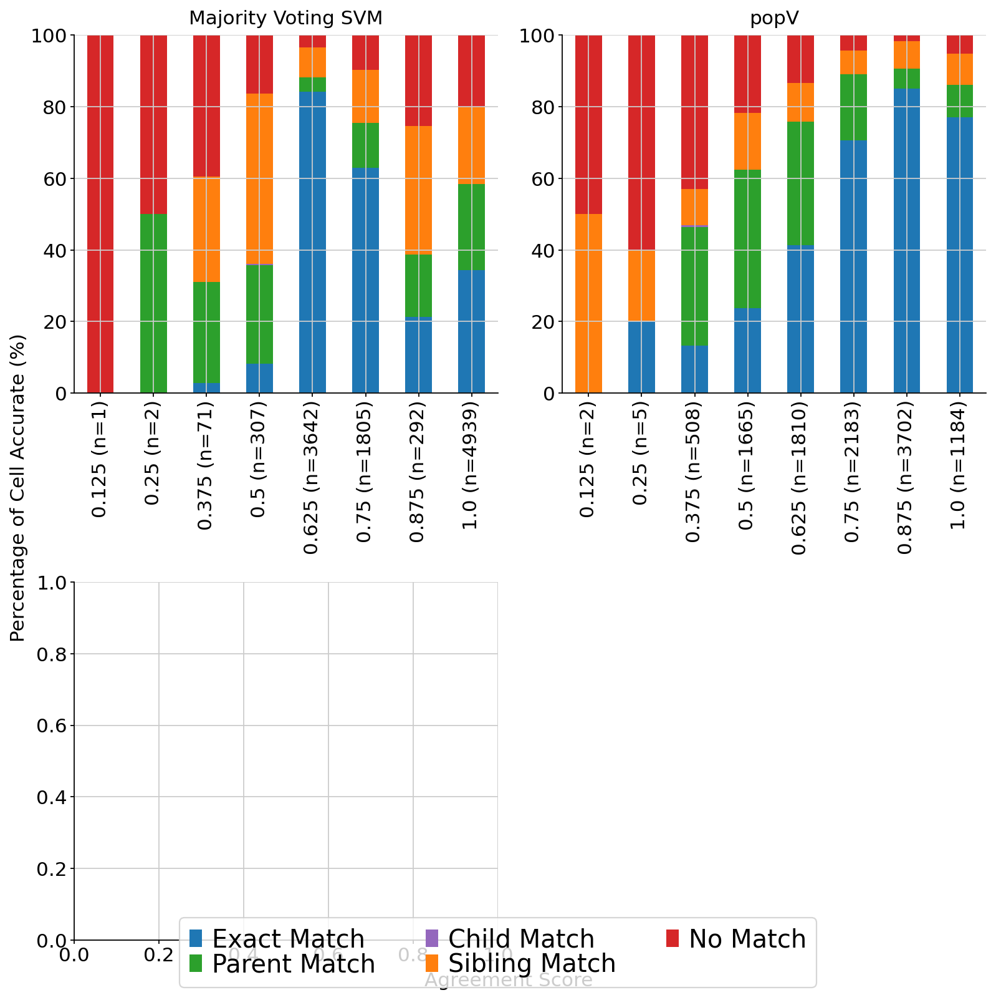

In [44]:
scores = [1, 2, 3, 4, 5, 6, 7, 8]
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
idx = -1
for ontology_accuracy, prediction_key in acc_annotated_cols_dict.items():
    idx += 1
    exact_acc = []
    parent_acc = []
    child_acc = []
    sibling_acc = []
    neighborhood_acc = []
    ns = []
    for score in scores:
        df = query.obs[[prediction_key+'_probabilities', ontology_accuracy]]
        tmp = df[np.logical_and(df[prediction_key+'_probabilities']>(score-1)/np.max(scores), df[prediction_key+'_probabilities']<=score/np.max(scores))]
        n = tmp.shape[0] + 1
        
        ns.append(n)
        
        correct1 = tmp[tmp[ontology_accuracy] == exact].shape[0]
        exact_acc.append(correct1/n)
        
        correct2 = tmp[tmp[ontology_accuracy] == parent].shape[0]
        parent_acc.append(correct2/n)
        
        correct3 = tmp[tmp[ontology_accuracy] == child].shape[0]
        child_acc.append(correct3/n)
        
        correct4 = tmp[tmp[ontology_accuracy] == sibling].shape[0]
        sibling_acc.append(correct4/n)
        
        neighborhood_score = (correct1+correct2+correct3+correct4)/n
        neighborhood_acc.append(neighborhood_score)
    
    labels = [f'{s} (n={n})' for s,n in zip(scores/np.max(scores), ns)]
    df = pd.DataFrame(index = labels)
    df['Exact Match'] = exact_acc * np.array(ns) #/ np.sum(ns)
    df['Parent Match'] = parent_acc * np.array(ns) #/ np.sum(ns)
    df['Child Match'] = child_acc * np.array(ns) #/ np.sum(ns)
    df['Sibling Match'] = sibling_acc * np.array(ns) #/ np.sum(ns)
    df['No Match'] =  (np.array(ns) - df.sum(axis=1)) #/ np.sum(ns)
    df = 100 * df.div(df.sum(axis=1), axis=0)
    axs_ = axs[idx//3, idx%3]
    df.plot.bar(stacked=True, color=color_map, ax=axs_, legend=False)
    if df.values.sum(axis=1).max()>40:
        axs_.set_ylim(0, 100)
    else:
        axs_.set_ylim(0, 40)
    
    axs_.set_title(rename_dict[prediction_key])

    #axs_.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),ncol=3)
    #plt.savefig(f'fig4/fig4_thymus_prediction_accuracy_{prediction_key}.pdf', bbox_inches='tight')
axs[-1, -1].axis('off')

handles, labels = axs_.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, labelspacing=0., prop={'size': 18})

fig.text(0.5, 0, 'Agreement Score', ha='center')
fig.text(0, 0.5, 'Percentage of Cell Accurate (%)', va='center', rotation='vertical')
fig.tight_layout()
plt.savefig('fig2/fig2_lung_majority_accuracy_svm.pdf', bbox_inches='tight')
plt.show()


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 46 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'F', 'M', 'P', 'R', 'S', 'V', 'a', 'c', 'colon', 'e', 'eight', 'equal', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'j', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 37, 38, 41, 48, 51, 53, 54, 57, 68, 70, 72, 73, 74, 76, 77, 79, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 51 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'F', 'M', 'P', 'R', 'S', 'V', 'a', 'c', 'colon', 'e', 'eight', 'equal', 'f', 'fi', 'five', 'fl', 'four', 'g', 'hyphen', 'i', 'j', 'l', 'n', 'nine', 'nonmarkingreturn', 'o

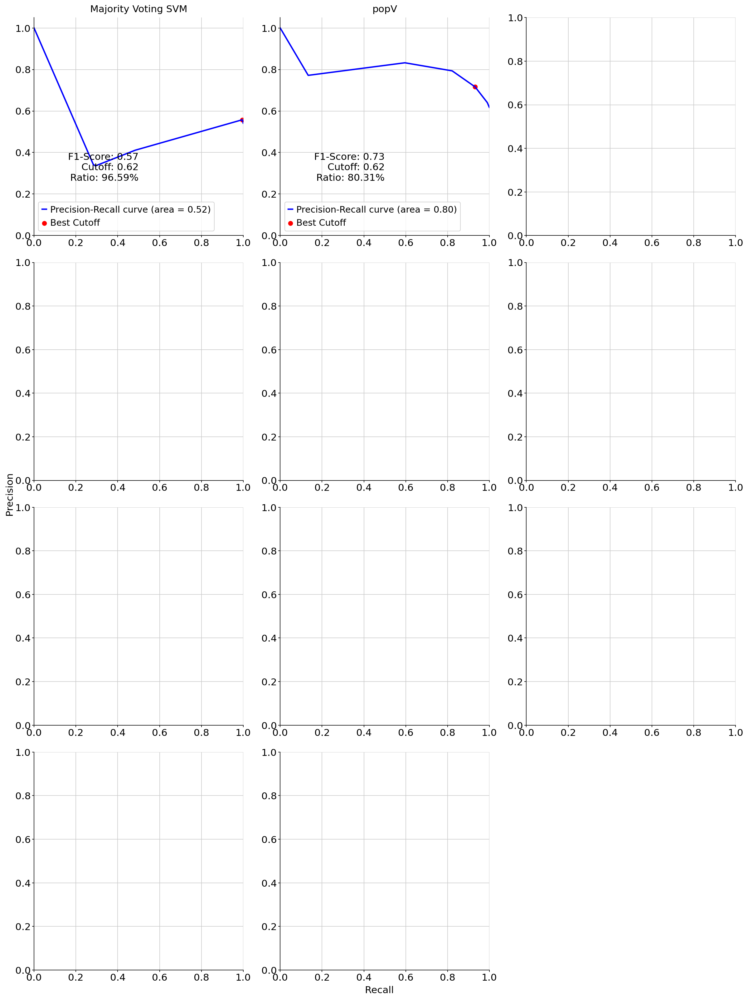

In [35]:
from sklearn.metrics import precision_recall_curve, auc, accuracy_score

scores = [1, 2, 3, 4, 5, 6, 7, 8]
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
tcells = query[query.obs['cell_ontology_class'].isin(tcells_cells)].copy()
idx = -1
for ontology_accuracy, prediction_key in acc_annotated_cols_dict.items():
    idx += 1
    
    y_val = tcells.obs[ontology_accuracy]=='exact'
    probabilities = tcells.obs[prediction_key+'_probabilities']

    # Compute Precision-Recall curve and area under the curve
    precision, recall, thresholds = precision_recall_curve(y_val, probabilities)
    pr_auc = auc(recall, precision)

    # Calculate the F1 score to find the best threshold (cutoff)
    f1_scores = 2*recall*precision / (recall + precision + 1e-3)
    best_idx = np.argmax(f1_scores)
    best_cutoff = thresholds[best_idx]

    # Apply the best cutoff to make final predictions
    predictions = np.where(probabilities > (best_cutoff - 1e-3), 1, 0)

    # Calculate the accuracy of predictions above the cutoff
    accuracy_above_cutoff = accuracy_score(y_val, predictions)
    axs_ = axs[idx//3, idx%3]
    
    axs_.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
    axs_.scatter(recall[best_idx], precision[best_idx], marker='o', color='red', label='Best Cutoff')
    axs_.annotate(f'F1-Score: {accuracy_above_cutoff:.2f}\nCutoff: {best_cutoff:.2f}\nRatio: {(np.mean(predictions) * 100):.2f}%',
                xy=(recall[best_idx], precision[best_idx]), xytext=(0.5, 0.4),
                horizontalalignment='right', verticalalignment='top')
    axs_.legend(loc="lower left")
    axs_.set_title(rename_dict[prediction_key])
    axs_.set_xlim([0.0, 1.0])
    axs_.set_ylim([0.0, 1.05])

    #axs_.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),ncol=3)
    #plt.savefig(f'fig4/fig4_thymus_prediction_accuracy_{prediction_key}.pdf', bbox_inches='tight')
axs[-1, -1].axis('off')
fig.text(0.5, 0, 'Recall', ha='center')
fig.text(0, 0.5, 'Precision', va='center', rotation='vertical')
fig.tight_layout()
plt.savefig('fig2/fig2_lung_majority_svm.pdf', bbox_inches='tight')
plt.show()


In [36]:
from scanpy.plotting import palettes

... storing 'consensus_ontology_accuracy' as categorical
... storing 'consensus_svm_ontology_accuracy' as categorical


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 45 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 22, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 59, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 50 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', '

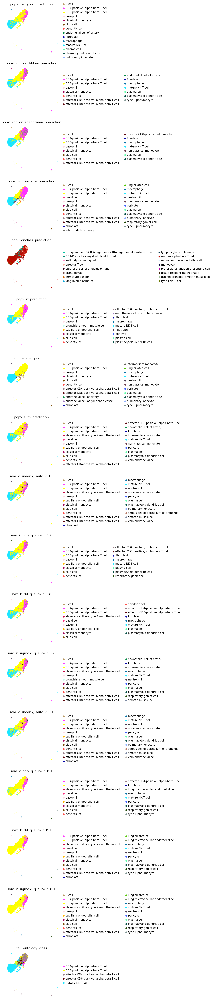

In [39]:
cell_types = pd.unique(tcells.obs[[i for i in (list(tcells.uns['prediction_keys']) + ['popv_parent', 'cell_ontology_class'] + prediction_keys)]].values.ravel('K'))
palette = palettes.default_102
sub_cluster_id_colors = {i: j for i, j in zip(list(cell_types), palette)}
query = tcells[tcells.obs['_dataset']=='query']
color_keys = list(query.uns['prediction_keys']) + prediction_keys + ['cell_ontology_class']
sc.pl.umap(query, color=color_keys, ncols=1, palette=sub_cluster_id_colors, frameon=False, legend_fontsize='small',
           show=True, save='predictors_tcell_svm_popv.pdf')

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 34 glyphs before
Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 66, 68, 69, 70, 71, 72, 73, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92]
Closed glyph list over 'GSUB': 39 glyphs after
Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'fi', 'five', 'fl', 'four', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'uniFB00', 'uniFB03', 'uniFB04', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 

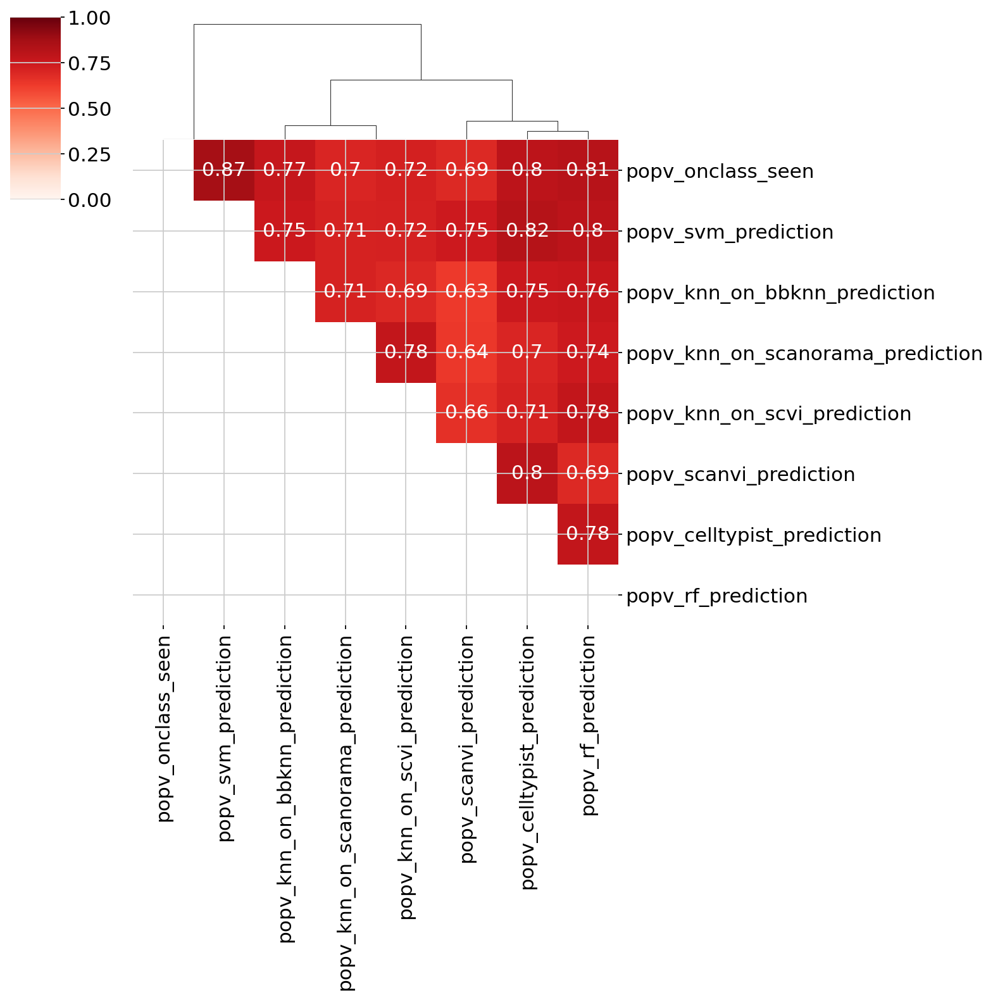

In [41]:
def max_diff(x, y):
    return abs(np.max(x) - np.max(y))

from sklearn.metrics.pairwise import cosine_similarity
query.obs[query.uns['prediction_keys_seen']]
# Get the predictions from each column
predictions = query.obs.loc[query.obs['popv_prediction_score'].astype(int)<9, query.uns['prediction_keys_seen']]
categories = pd.Categorical(predictions.values.ravel()).categories
mapping = {category: code for code, category in enumerate(categories)}

# convert categories to codes using the mapping
codes = predictions.applymap(mapping.get)

jaccard_similarity_matrix = 1 - pdist(codes.T, metric='hamming')
# convert the condensed distance matrix to a square matrix
jaccard_similarity_matrix = pd.DataFrame(squareform(jaccard_similarity_matrix), index=predictions.columns, columns=predictions.columns) 

# plot the heatmap
g = sns.clustermap(jaccard_similarity_matrix, annot=True, cmap='Reds', method='complete', figsize=(10, 10), metric=max_diff, vmin=0)
plt.close()
mask = np.tril(np.ones_like(jaccard_similarity_matrix))
mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]
g = sns.clustermap(jaccard_similarity_matrix, annot=True, mask=mask, cmap='Reds', method='complete', figsize=(10, 10), metric=max_diff, vmin=0, vmax=1)
g.ax_row_dendrogram.set_visible(False)

plt.savefig('fig2/jaccard_similarity_matrix_popv.pdf', bbox_inches='tight', dpi=600)
# show the plot
plt.show()

In [42]:
pd.options.display.max_columns = None
pd.options.display.max_columns = 500

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 36 glyphs before
Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 66, 68, 69, 70, 71, 72, 73, 74, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 41 glyphs after
Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'fi', 'five', 'fl', 'four', 'g', 'i', 'k', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'uniFB00', 'uniFB03', 'uniFB04', 'v', 'y', 'zero']
Glyph IDs:   [0, 1

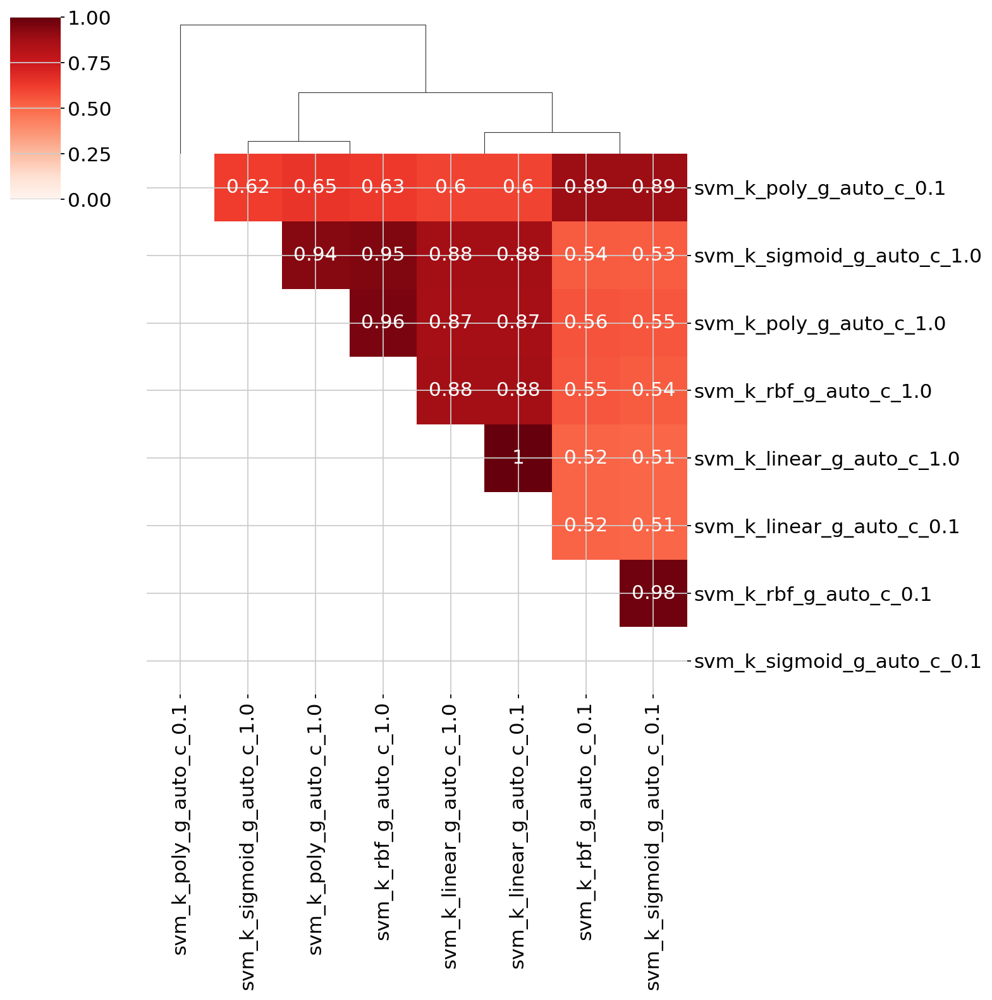

In [43]:
predictions = query.obs.loc[query.obs['popv_prediction_score'].astype(int)<9, prediction_keys]
categories = pd.Categorical(predictions.values.ravel()).categories
mapping = {category: code for code, category in enumerate(categories)}

# convert categories to codes using the mapping
codes = predictions.applymap(mapping.get)

jaccard_similarity_matrix = 1 - pdist(codes.T, metric='hamming')
# convert the condensed distance matrix to a square matrix
jaccard_similarity_matrix = pd.DataFrame(squareform(jaccard_similarity_matrix), index=predictions.columns, columns=predictions.columns) 
# plot the heatmap
g = sns.clustermap(jaccard_similarity_matrix, annot=True, cmap='Reds', method='complete', figsize=(10, 10), metric=max_diff, vmin=0)
plt.close()
mask = np.tril(np.ones_like(jaccard_similarity_matrix))
mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]
g = sns.clustermap(jaccard_similarity_matrix, annot=True, mask=mask, cmap='Reds', method='complete', figsize=(10, 10), metric=max_diff, vmin=0, vmax=1)
g.ax_row_dendrogram.set_visible(False)
plt.savefig('fig2/subsample_svm_01.pdf', bbox_inches='tight', dpi=600)
# show the plot
plt.show()

In [20]:
query.obs['majority_vote_svm'] = query.obs[prediction_keys].apply(lambda x: x.mode()[0], axis=1)
query.obs['majority_vote_svm_score'] = query.obs[prediction_keys].apply(lambda x: x.value_counts().max(), axis=1).astype('category')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 37 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'v', 'y']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 21, 23, 27, 37, 38, 39, 46, 49, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 42 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'j', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'uniFB00', 'uniFB03', 'uniFB04', 'v', 'y']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 21, 

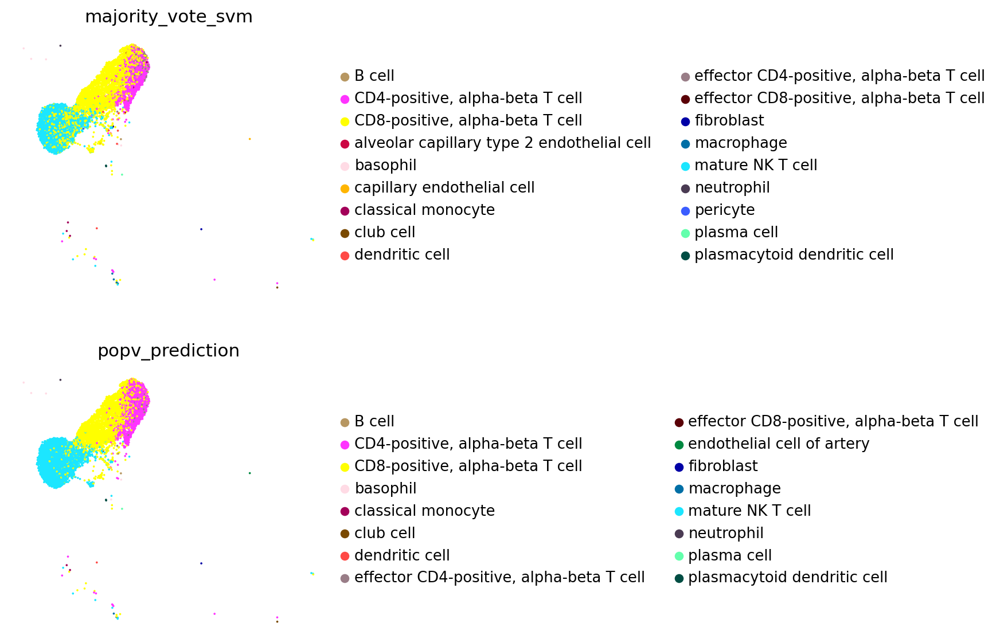

In [45]:
sc.pl.umap(query, color=['majority_vote_svm', 'popv_prediction'], frameon=False, palette=sub_cluster_id_colors, legend_fontsize='small', save='majority_vote_svm.pdf', ncols=1)

In [46]:
palette = sc.plotting.palettes.default_20
celltype_colors = {i: j for i, j in zip(np.arange(9), palette)}

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 28 glyphs before
Glyph names: ['.notdef', '.null', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'i', 'j', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'v', 'y']
Glyph IDs:   [0, 1, 2, 3, 20, 21, 22, 23, 24, 25, 26, 27, 66, 68, 70, 71, 72, 76, 77, 80, 81, 82, 83, 85, 86, 87, 89, 92]
Closed glyph list over 'GSUB': 28 glyphs after
Glyph names: ['.notdef', '.null', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'i', 'j', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'v', 'y']
Glyph IDs:   [0, 1, 2, 3, 20, 21, 22, 23, 24, 25, 26, 27, 66, 68, 70, 71, 72, 76, 77, 80, 81, 82, 83, 85, 86, 87, 89, 92]
Closing glyph list over 'MATH': 28 glyphs before
Glyph names: ['.notdef', '

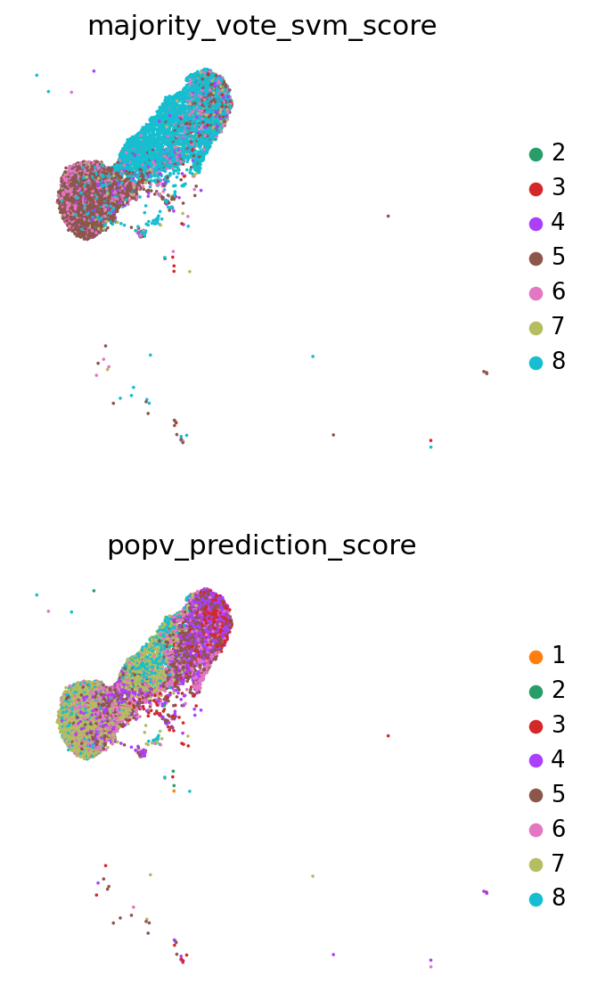

In [48]:
sc.pl.umap(query, color=['majority_vote_svm_score', 'popv_prediction_score'], palette=celltype_colors, frameon=False, legend_fontsize='small', save='majority_vote_svm_score.pdf', ncols=1)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


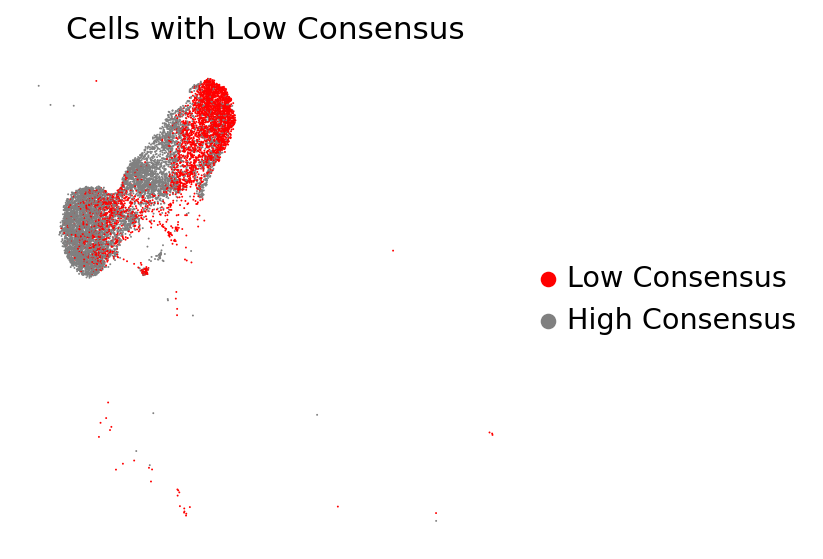

In [26]:
low_agreement_scores = ['1', '2', '3', '4', '5']
high_agreement_scores = ['6', '7', '8']

replace_dict = dict.fromkeys(low_agreement_scores, 'Low Consensus')
replace_dict.update(dict.fromkeys(high_agreement_scores, 'High Consensus'))

query.obs['popv_score_agreement'] = query.obs['popv_prediction_score'].astype(str).replace(replace_dict)
query.obs['popv_score_agreement'] = query.obs['popv_score_agreement'].astype('category').cat.reorder_categories(['Low Consensus','High Consensus'])

ax = sc.pl.umap(query, 
                color = 'popv_score_agreement',
                palette = {
                      'Low Consensus':'red',
                      'High Consensus':'gray',
                     },
                title='Cells with Low Consensus',
                return_fig=True,
                size=3
          )

ax.get_figure().savefig('fig2/high_uncertainty_popv_tcell.pdf', bbox_inches='tight', dpi=600)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


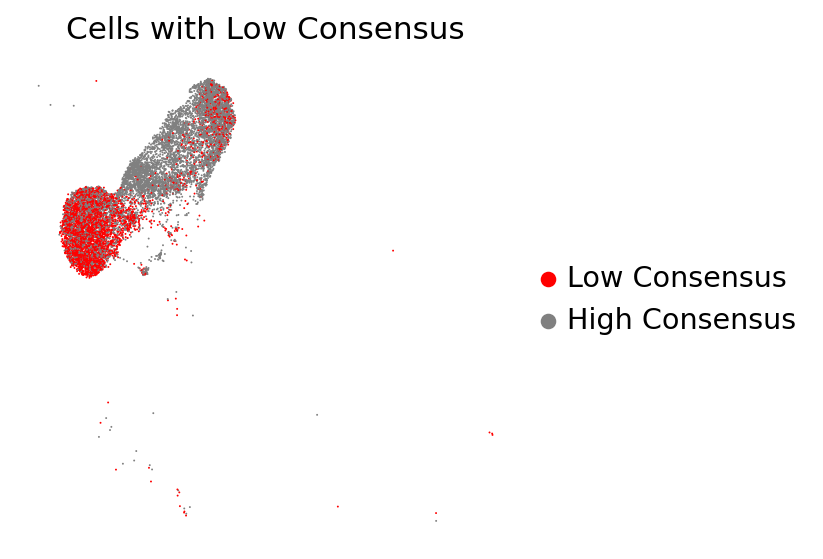

In [27]:
low_agreement_scores = ['1', '2', '3', '4', '5']
high_agreement_scores = ['6', '7', '8']

replace_dict = dict.fromkeys(low_agreement_scores, 'Low Consensus')
replace_dict.update(dict.fromkeys(high_agreement_scores, 'High Consensus'))

query.obs['popv_svm_score_agreement'] = query.obs['majority_vote_svm_score'].astype(str).replace(replace_dict)
query.obs['popv_svm_score_agreement'] = query.obs['popv_svm_score_agreement'].astype('category').cat.reorder_categories(['Low Consensus','High Consensus'])

ax = sc.pl.umap(query, 
                color = 'popv_svm_score_agreement',
                palette = {
                      'Low Consensus':'red',
                      'High Consensus':'gray',
                     },
                title='Cells with Low Consensus',
                return_fig=True,
                size=3
          )

ax.get_figure().savefig('fig2/high_uncertainty_svm.pdf', bbox_inches='tight', dpi=600)



In [29]:
np.unique(tcells[tcells.obs['_dataset']=='query'].obs['paper_annotation'])

array(['CD4+ Memory/Effector T', 'CD4+ Naive T', 'CD8+ Memory/Effector T',
       'CD8+ Naive T', 'Natural Killer', 'Natural Killer T',
       'Proliferating NK/T'], dtype=object)

In [34]:
np.mean(query.obs['cell_ontology_class'].astype(str)==query.obs['majority_vote_svm'].astype(str))

0.5412179893222333

In [35]:
np.mean(query.obs['cell_ontology_class'].astype(str)==query.obs['popv_prediction'].astype(str))

0.6170482309293277

In [ ]:
from popv import _accuracy

: 

In [ ]:
_accuracy._ontology_accuracy(
    adata, 
    obofile=obo_fn,
    gt_key='cell_ontology_class', 
    pred_key='popv_prediction',
    save_key=f'consensus_ontology_accuracy')

In [ ]:
color_map = ['#1f77b4',
             '#2ca02c',
             '#9467bd',
             '#ff7f0e',
             '#d62728',
             '#8c564b',
             '#e377c2',
             '#7f7f7f',
             '#bcbd22',
             '#17becf']

In [ ]:
scores = [1, 2, 3, 4, 5, 6, 7, 8]
fig, axs = plt.subplots(4, 3, figsize=(15, 20))
idx = -1
for ontology_accuracy, prediction_key in acc_annotated_cols_dict.items():
    idx += 1
    exact_acc = []
    parent_acc = []
    child_acc = []
    sibling_acc = []
    neighborhood_acc = []
    ns = []
    for score in scores:
        df = query.obs[[prediction_key+'_probabilities', ontology_accuracy]]
        tmp = df[np.logical_and(df[prediction_key+'_probabilities']>(score-1)/np.max(scores), df[prediction_key+'_probabilities']<=score/np.max(scores))]
        n = tmp.shape[0] + 1
        
        ns.append(n)
        
        correct1 = tmp[tmp[ontology_accuracy] == exact].shape[0]
        exact_acc.append(correct1/n)
        
        correct2 = tmp[tmp[ontology_accuracy] == parent].shape[0]
        parent_acc.append(correct2/n)
        
        correct3 = tmp[tmp[ontology_accuracy] == child].shape[0]
        child_acc.append(correct3/n)
        
        correct4 = tmp[tmp[ontology_accuracy] == sibling].shape[0]
        sibling_acc.append(correct4/n)
        
        neighborhood_score = (correct1+correct2+correct3+correct4)/n
        neighborhood_acc.append(neighborhood_score)
    
    labels = [f'{s} (n={n})' for s,n in zip(scores/np.max(scores), ns)]
    df = pd.DataFrame(index = labels)
    df['Exact Match'] = exact_acc * np.array(ns) #/ np.sum(ns)
    df['Parent Match'] = parent_acc * np.array(ns) #/ np.sum(ns)
    df['Child Match'] = child_acc * np.array(ns) #/ np.sum(ns)
    df['Sibling Match'] = sibling_acc * np.array(ns) #/ np.sum(ns)
    df['No Match'] =  (np.array(ns) - df.sum(axis=1)) #/ np.sum(ns)
    df = 100 * df.div(df.sum(axis=1), axis=0)
    axs_ = axs[idx//3, idx%3]
    df.plot.bar(stacked=True, color=color_map, ax=axs_, legend=False)
    if df.values.sum(axis=1).max()>40:
        axs_.set_ylim(0, 100)
    else:
        axs_.set_ylim(0, 40)
    
    axs_.set_title(rename_dict[prediction_key])

    #axs_.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3),ncol=3)
    #plt.savefig(f'fig4/fig4_thymus_prediction_accuracy_{prediction_key}.pdf', bbox_inches='tight')
axs[-1, -1].axis('off')

handles, labels = axs_.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, labelspacing=0., prop={'size': 18})

fig.text(0.5, 0, 'Agreement Score', ha='center')
fig.text(0, 0.5, 'Percentage of Cell Accurate (%)', va='center', rotation='vertical')
fig.tight_layout()
plt.savefig('fig4/fig4_thymus_score_accuracy.pdf', bbox_inches='tight')
plt.show()


In [ ]:
ct_paper = np.unique(tcells[tcells.obs['_dataset']=='query'].obs['paper_annotation'])
for i in ct_paper:
    tcells.obs[i] = [i if j==i else None for j in tcells.obs['paper_annotation']]
fig = sc.pl.umap(tcells[tcells.obs['_dataset']=='query'], color = ct_paper, ncols=3, legend_loc='on data', na_in_legend=False, return_fig=True)
fig.savefig('fig2/fig2_umap_query_tcell.pdf', bbox_inches='tight')

NameError: name 'np' is not defined

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


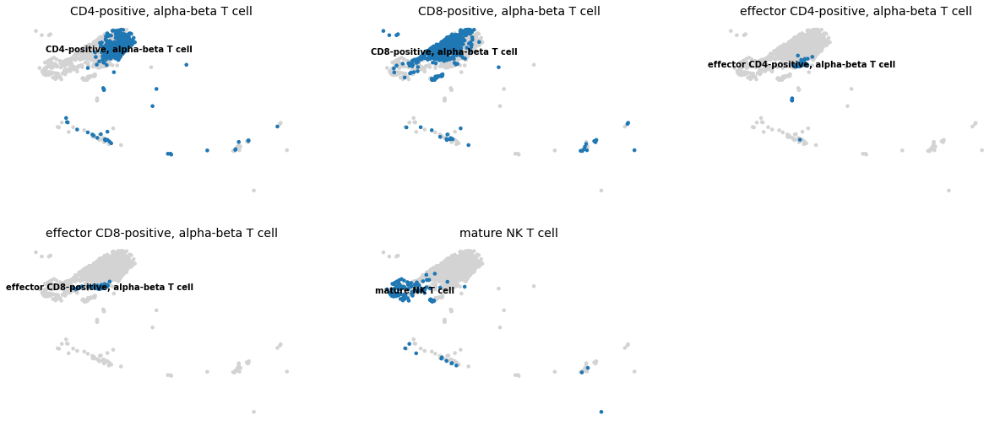

In [ ]:
ct_paper = np.unique(tcells[tcells.obs['_dataset']=='ref'].obs['cell_ontology_class'])
for i in ct_paper:
    tcells.obs[i] = [i if j==i else None for j in tcells.obs['cell_ontology_class']]
fig = sc.pl.umap(tcells[tcells.obs['_dataset']=='ref'], color = ct_paper, ncols=3, legend_loc='on data', na_in_legend=False, return_fig=True)
fig.savefig('fig2/fig2_umap_ref_tcell.pdf', bbox_inches='tight')

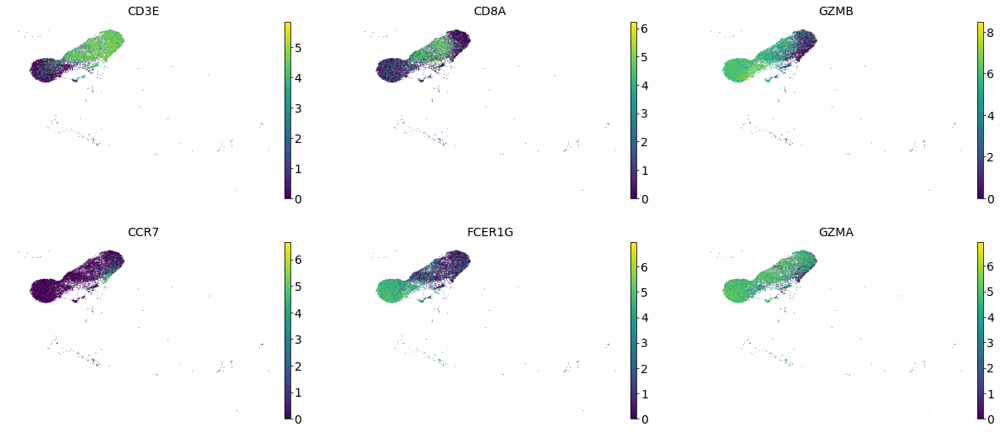

In [ ]:
fig = sc.pl.umap(tcells, color=['CD3E', 'CD8A', 'GZMB', 'CCR7', 'FCER1G', 'GZMA'], ncols=3, size=3, return_fig=True)
fig.savefig('fig2/fig2_umap_markers.pdf', bbox_inches='tight')

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


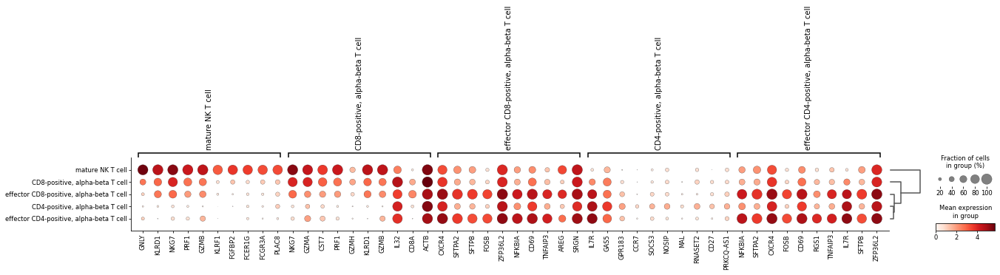

In [ ]:
ref = tcells[tcells.obs['_dataset']=='ref']
ref.uns['log1p']['base'] = 2
sc.tl.rank_genes_groups(ref, groupby='cell_ontology_class')
fig = sc.pl.rank_genes_groups_dotplot(ref, return_fig=True)
fig.savefig('fig2/fig2_ts_de_tcell.pdf', bbox_inches='tight')

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


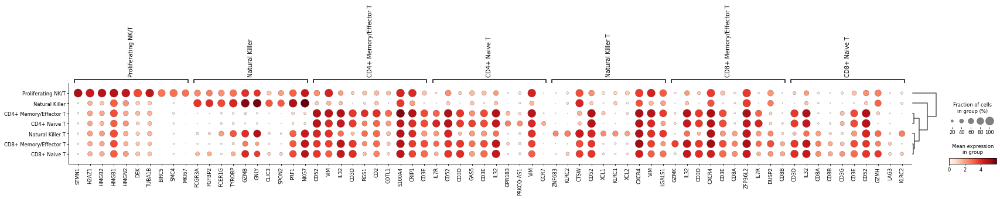

In [ ]:
query = tcells[tcells.obs['_dataset']=='query']
query.uns['log1p']['base'] = 2
sc.tl.rank_genes_groups(query, groupby='paper_annotation')
fig = sc.pl.rank_genes_groups_dotplot(query, return_fig=True)
fig.savefig('fig2/fig2_lca_de_tcell.pdf', bbox_inches='tight')

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


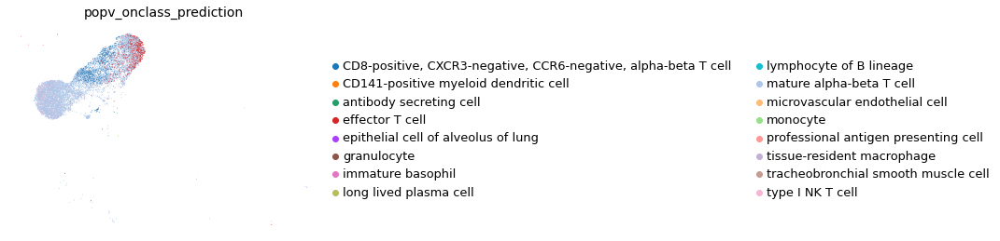

In [ ]:
fig = sc.pl.umap(tcells[tcells.obs['_dataset']=='query'], color = ['popv_onclass_prediction'], ncols=3, size=3, return_fig=True)
fig.savefig('fig2/fig2_umap_onclass.pdf', bbox_inches='tight')


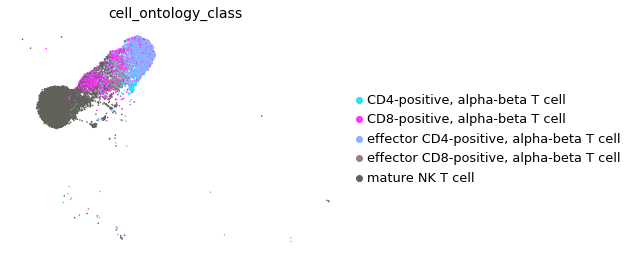

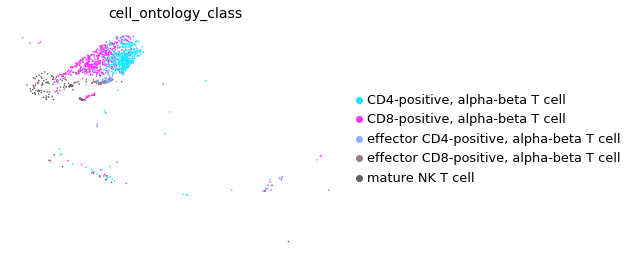

In [ ]:
sc.pl.umap(tcells[tcells.obs['_dataset']=='query'], color = ['cell_ontology_class'], ncols=1, size=10)
sc.pl.umap(tcells[tcells.obs['_dataset']=='ref'], color = ['cell_ontology_class'], ncols=1, size=10)

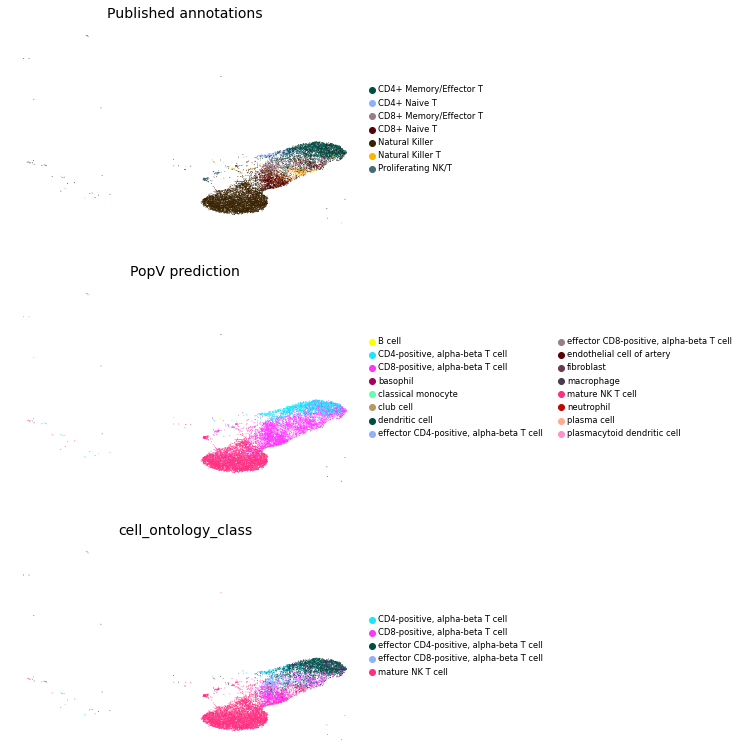

In [ ]:
ax = sc.pl.umap(tcells, color=['paper_annotation', 'popv_prediction', 'cell_ontology_class'], ncols=1, legend_fontsize='small', dimensions=[1, 0],
           title=['Published annotations', 'PopV prediction'],
           return_fig=True,
           size=3
          )

ax.get_figure().savefig('fig2/tcells.pdf', bbox_inches='tight', dpi=600)

# Endothelial cells

In [ ]:
endothelial_cells = [
    'Capillary',
    'Capillary Aerocyte',
    'Bronchial Vessel 2',
    'Vein',
    'Artery',
    'Bronchial Vessel 1',
    'Lymphatic',
    'Capillary Intermediate 2',
    'Capillary Intermediate 1'
]

In [ ]:
endothelial = adata[adata.obs['paper_annotation'].isin(endothelial_cells)].copy()
endothelial = endothelial[
    endothelial.obs['popv_prediction'].isin(endothelial.obs['popv_prediction'].value_counts().index[endothelial.obs['popv_prediction'].value_counts() > 10])
]

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


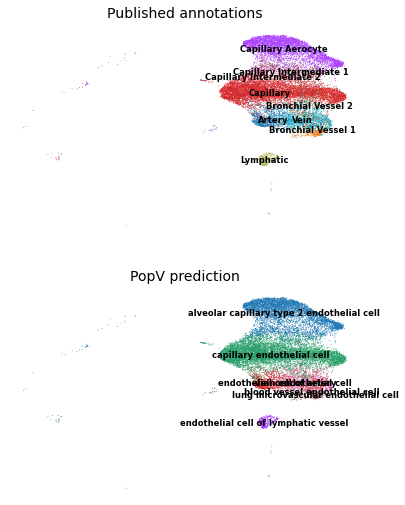

In [ ]:
ax = sc.pl.umap(endothelial, color=['paper_annotation', 'popv_prediction'], ncols=1, legend_loc='on data', legend_fontsize='small', dimensions=[1, 0],
           title=['Published annotations', 'PopV prediction'],
           return_fig=True,
           size=3
          )

ax.get_figure().savefig('fig2/endothelial_cells.pdf', bbox_inches='tight', dpi=600)

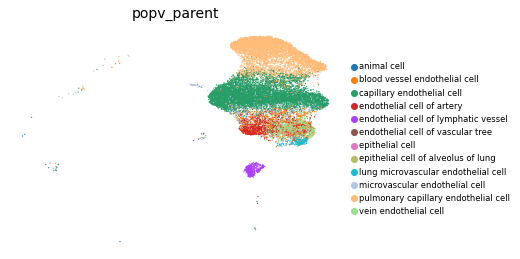

In [ ]:
ax = sc.pl.umap(endothelial, color=['popv_parent'], ncols=1, legend_fontsize='small', dimensions=[1, 0])

In [ ]:
endothelial.obs[['popv_parent', 'paper_annotation']].value_counts()

popv_parent                           paper_annotation        
capillary endothelial cell            Capillary                   7432
pulmonary capillary endothelial cell  Capillary Aerocyte          4848
endothelial cell of artery            Artery                      1089
vein endothelial cell                 Vein                         911
microvascular endothelial cell        Capillary                    607
endothelial cell of lymphatic vessel  Lymphatic                    497
blood vessel endothelial cell         Artery                       372
pulmonary capillary endothelial cell  Capillary Intermediate 1     369
capillary endothelial cell            Capillary Intermediate 1     300
                                      Capillary Intermediate 2     290
blood vessel endothelial cell         Vein                         251
lung microvascular endothelial cell   Bronchial Vessel 1           208
blood vessel endothelial cell         Capillary                    145
              

In [ ]:
sc.pp.neighbors(endothelial, use_rep="X_scanvi", n_neighbors=10)
sc.tl.umap(endothelial, min_dist=0.5)


In [ ]:
endothelial.uns['paper_annotation_colors']

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf']

In [ ]:
endothelial.obs['popv_prediction'].value_counts()

capillary endothelial cell                    9135
alveolar capillary type 2 endothelial cell    5670
endothelial cell of artery                    1578
vein endothelial cell                         1218
endothelial cell of lymphatic vessel           506
lung microvascular endothelial cell            339
blood vessel endothelial cell                   19
Name: popv_prediction, dtype: int64

In [ ]:
palette = {i: k for k, i in palette.items()}

AttributeError: 'list' object has no attribute 'items'

In [ ]:
palette

{'alveolar capillary type 2 endothelial cell': '#1f77b4',
 'capillary endothelial cell': '#ff7f0e',
 'endothelial cell of lymphatic vessel': '#279e68',
 'endothelial cell of artery': '#d62728',
 'vein endothelial cell': '#aa40fc',
 'lung microvascular endothelial cell': '#8c564b',
 'Capillary Intermediate 1': '#e377c2',
 'Capillary Intermediate 2': '#b5bd61',
 'blood vessel endothelial cell': '#17becf'}

In [ ]:
palette = {
    'Capillary Aerocyte': '#1f77b4',
    'Capillary': '#ff7f0e',
    'Lymphatic': '#279e68',
    'Artery': '#d62728',
    'Vein': '#aa40fc',
    'Bronchial Vessel 1': '#8c564b',
    'Capillary Intermediate 1': '#e377c2',
    'Capillary Intermediate 2': '#b5bd61',
    'Bronchial Vessel 2': '#17becf',
    'alveolar capillary type 2 endothelial cell': '#1f77b4',
    'capillary endothelial cell': '#ff7f0e',
    'endothelial cell of lymphatic vessel': '#279e68',
    'endothelial cell of artery': '#d62728',
    'vein endothelial cell': '#aa40fc',
    'lung microvascular endothelial cell': '#8c564b',
    'blood vessel endothelial cell': '#17becf'
}

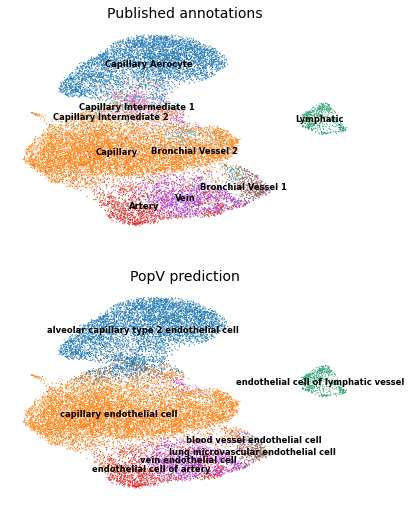

In [ ]:
ax = sc.pl.umap(endothelial, color=['paper_annotation', 'popv_prediction'], ncols=1, legend_loc='on data', legend_fontsize='small', dimensions=[0, 1],
           title=['Published annotations', 'PopV prediction', ''],
           return_fig=True,
           size=5,
           palette=palette
          )

ax.get_figure().savefig('fig2/endothelial_cells_recomputed.pdf', bbox_inches='tight', dpi=600)

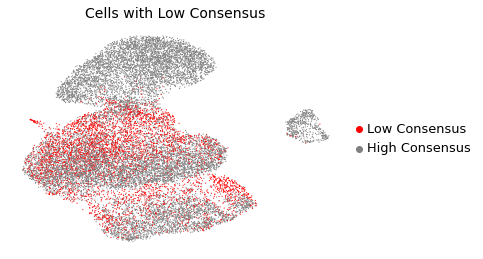

In [ ]:
ax = sc.pl.umap(endothelial, 
                color = 'popv_score_agreement',
                palette = {
                      'Low Consensus':'red',
                      'High Consensus':'gray',
                     },
                title='Cells with Low Consensus',
                return_fig=True,
                size=5
          )

ax.get_figure().savefig('fig2/endothelial_high_uncertainty.pdf', bbox_inches='tight', dpi=600)



In [ ]:
query.obs['paper_annotation']

P1_3_CTAAGACAGTGCGATG                Capillary
P1_3_GCGCCAACAGTAACGG       Capillary Aerocyte
P1_3_GCGAGAAGTAAGGGAA       Capillary Aerocyte
P1_3_GCGAGAACACAGAGGT       Capillary Aerocyte
P1_3_GCGAGAACAAATACAG       Capillary Aerocyte
                                   ...        
N14_B002460.gencode.vH29             Capillary
L2_B002460.gencode.vH29              Capillary
H9_B002460.gencode.vH29                 Artery
H4_B003269.gencode.vH29              Capillary
H12_B003269.gencode.vH29             Capillary
Name: paper_annotation, Length: 18465, dtype: category
Categories (9, object): ['Artery', 'Bronchial Vessel 1', 'Bronchial Vessel 2', 'Capillary', ..., 'Capillary Intermediate 1', 'Capillary Intermediate 2', 'Lymphatic', 'Vein']

# Further interrogation

In [ ]:
endothelial_cells_ts = [
    'capillary endothelial cell',
    'alveolar capillary type 2 endothelial cell',
    'endothelial cell of artery',
    'vein endothelial cell',
    'endothelial cell of lymphatic vessel',
    'lung microvascular endothelial cell',
    'blood vessel endothelial cell'
]

In [ ]:
endothelial_all = adata[np.logical_or(adata.obs['paper_annotation'].isin(endothelial_cells), adata.obs['cell_ontology_class'].isin(endothelial_cells_ts))].copy()
endothelial_all = endothelial_all[
    endothelial_all.obs['popv_prediction'].isin(endothelial_all.obs['popv_prediction'].value_counts().index[endothelial_all.obs['popv_prediction'].value_counts() > 10])
]

In [ ]:
endothelial_all.obs['_dataset'].value_counts()

query    18474
ref       2775
Name: _dataset, dtype: int64

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


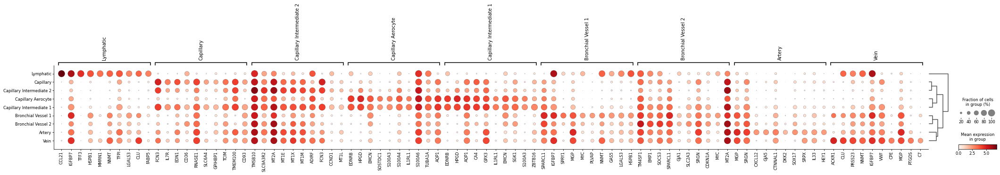

In [ ]:
query = endothelial_all[endothelial_all.obs['_dataset']=='query']
query.uns['log1p']['base'] = 2
sc.tl.rank_genes_groups(query, groupby='paper_annotation')
fig = sc.pl.rank_genes_groups_dotplot(query, return_fig=True, min_logfoldchange=1.)
fig.savefig('fig2/fig2_lca_de_endothelial.pdf', bbox_inches='tight')

In [ ]:
from scanpy.plotting import palettes

In [ ]:
sc.pp.neighbors(endothelial_all, use_rep="X_scanvi", n_neighbors=10)
sc.tl.umap(endothelial_all, min_dist=0.5)

In [ ]:
query = endothelial_all[endothelial_all.obs['_dataset']=='query']
ref = endothelial_all[endothelial_all.obs['_dataset']=='ref']

In [ ]:
endothelial_all.obs['_dataset'].value_counts()

query    18474
ref       2775
Name: _dataset, dtype: int64

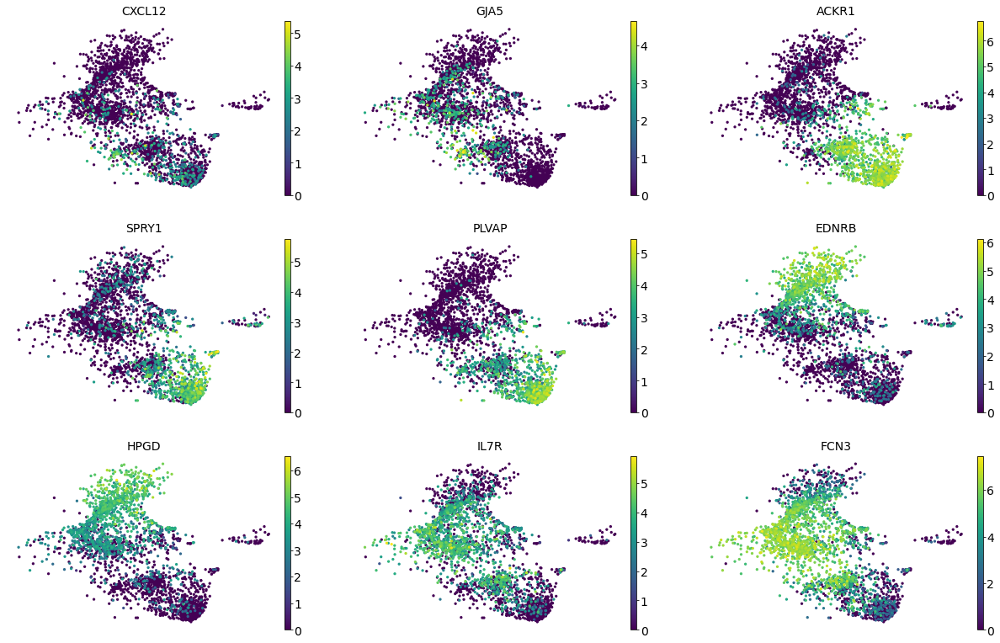

In [ ]:
sc.pl.umap(ref, color=['CXCL12', 'GJA5', 'ACKR1', 'SPRY1', 'PLVAP', 'EDNRB', 'HPGD', 'IL7R', 'FCN3'], ncols=3, frameon=False, legend_fontsize='small',
           show=True, save='markers_endothelial_query.pdf')

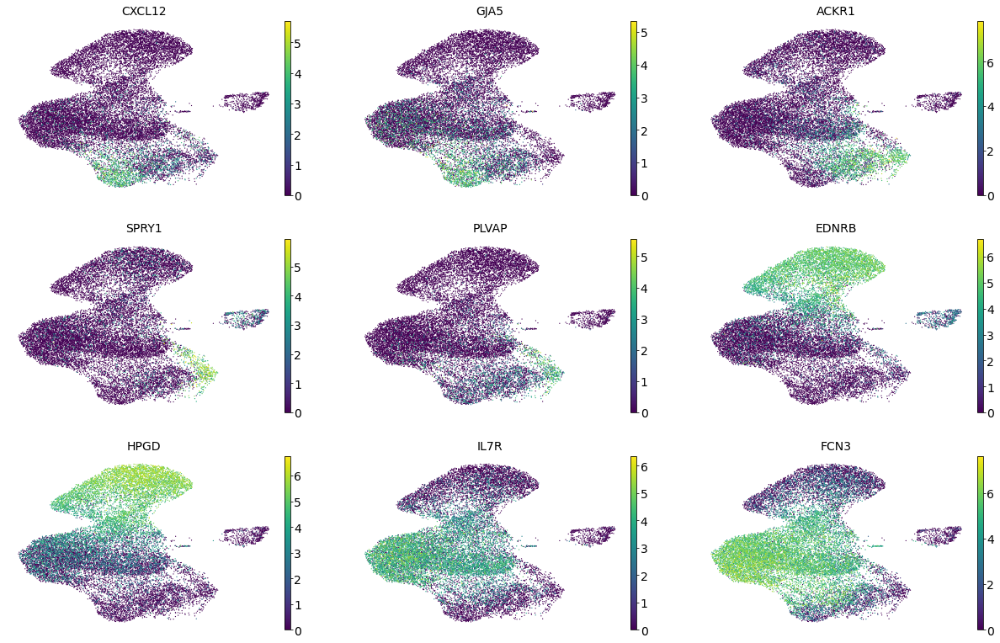

In [ ]:
sc.pl.umap(query, color=['CXCL12', 'GJA5', 'ACKR1', 'SPRY1', 'PLVAP', 'EDNRB', 'HPGD', 'IL7R', 'FCN3'], ncols=3, frameon=False, legend_fontsize='small',
           show=True, save='markers_endothelial_reference.pdf')

In [ ]:
endothelial_all = adata[np.logical_or(adata.obs['paper_annotation'].isin(endothelial_cells), adata.obs['cell_ontology_class'].isin(endothelial_cells_ts))].copy()
endothelial_all = endothelial_all[
    endothelial_all.obs['popv_prediction'].isin(endothelial_all.obs['popv_prediction'].value_counts().index[endothelial_all.obs['popv_prediction'].value_counts() > 10])
]

/home/cane/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


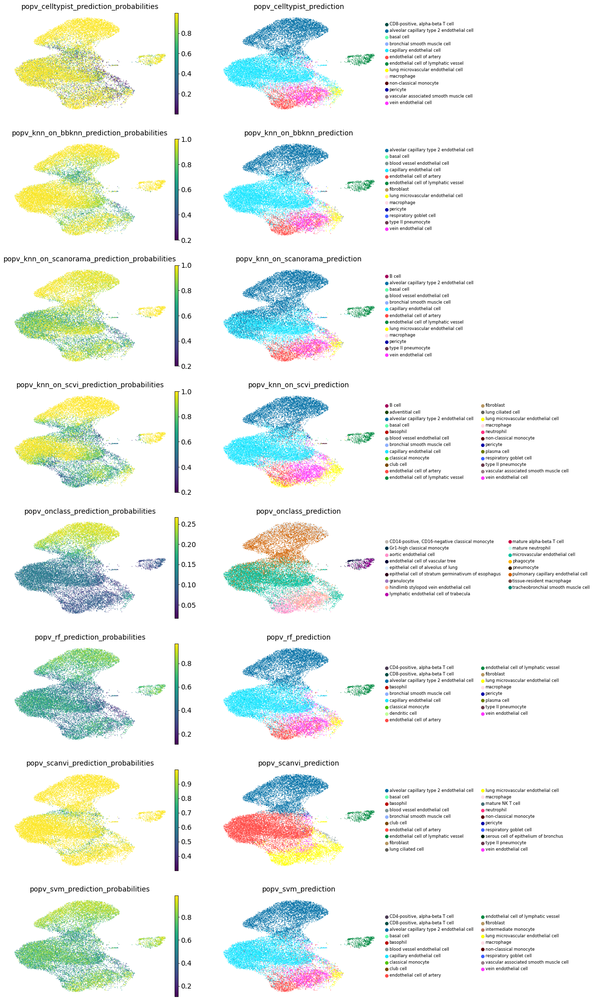

In [ ]:
cell_types = pd.unique(endothelial_all.obs[[i for i in endothelial_all.uns['prediction_keys']]].values.ravel('K'))
palette = palettes.default_102
sub_cluster_id_colors = {i: j for i, j in zip(list(cell_types), palette)}
color_keys = [[i+'_probabilities', i] for i in query.uns['prediction_keys']]
color_keys =  sum(color_keys, [])
sc.pl.umap(query, color=color_keys, ncols=2, palette=sub_cluster_id_colors, frameon=False, legend_fontsize='small',
           show=True, save='predictors_endothelial.pdf')


In [ ]:
query.obs['popv_onclass_prediction'].value_counts()

microvascular endothelial cell                          7885
pulmonary capillary endothelial cell                    5968
epithelial cell of alveolus of lung                     1534
aortic endothelial cell                                 1389
hindlimb stylopod vein endothelial cell                 1174
endothelial cell of vascular tree                        281
lymphatic endothelial cell of trabecula                  216
tissue-resident macrophage                                 8
pneumocyte                                                 6
tracheobronchial smooth muscle cell                        4
granulocyte                                                2
epithelial cell of stratum germinativum of esophagus       2
mature neutrophil                                          1
mature alpha-beta T cell                                   1
phagocyte                                                  1
Gr1-high classical monocyte                                1
CD14-positive, CD16-nega

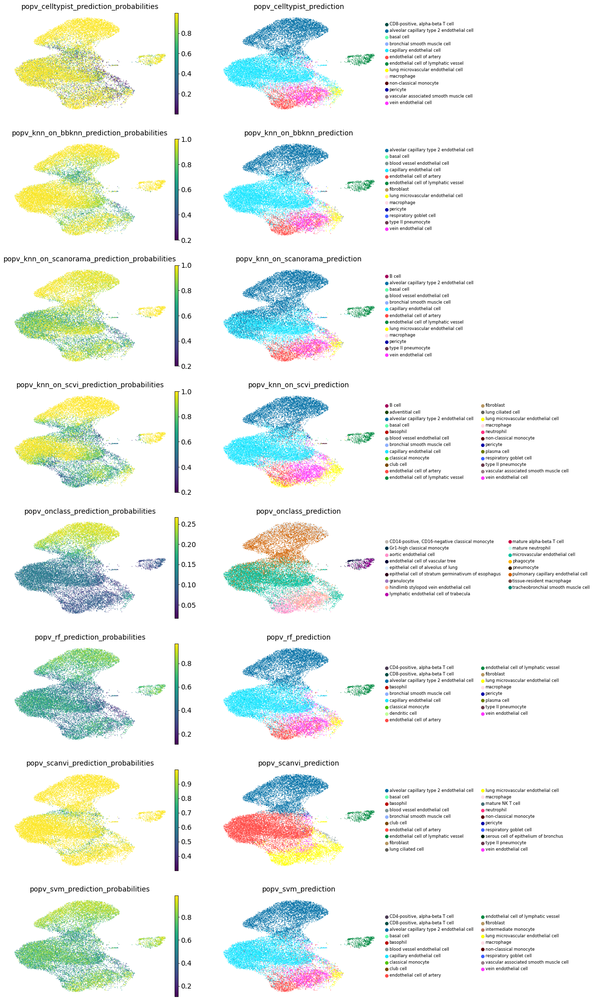

In [ ]:
sc.pl.umap(query, color=color_keys, ncols=2, palette=sub_cluster_id_colors, frameon=False, legend_fontsize='small',
           show=True, save='predictors_endothelial.pdf')